In [ ]:
import os
import loompy
import scipy
import pandas
import scanpy as sc
import scvelo as scv
import jinja2

def list_files_with_path_scandir(dir_path):
    """Lists files using os.scandir with full paths."""
    files = []
    with os.scandir(dir_path) as entries:
        for entry in entries:
            if entry.is_file():
                files.append(entry.path)
    return files



loom_dir = "velocyto_out"

In [ ]:
files = list_files_with_path_scandir(loom_dir)

In [ ]:
loompy.combine(files, "placenta_combo.loom", key="Accession")

In [ ]:
adata = sc.read("placenta_adata.h5ad", cache=True)
ldata = sc.read("placenta_combo.loom", cache=True)
adata = scv.utils.merge(adata, ldata)

In [2]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params(
    'scvelo',
    dpi=100,
    dpi_save=200,
    transparent=True,
    fontsize=12,
    figsize=(8, 8),
    frameon=False
)  # for beautified visualization
scv.set_figure_params(vector_friendly=False)

In [18]:
scv.pp.filter_and_normalize(adata, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


Filtered out 9493 genes that are detected 30 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
/tmp/ipykernel_54098/3360365749.py:2: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [19]:
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)

computing velocities


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=54098) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:01:12) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_clusters.svg


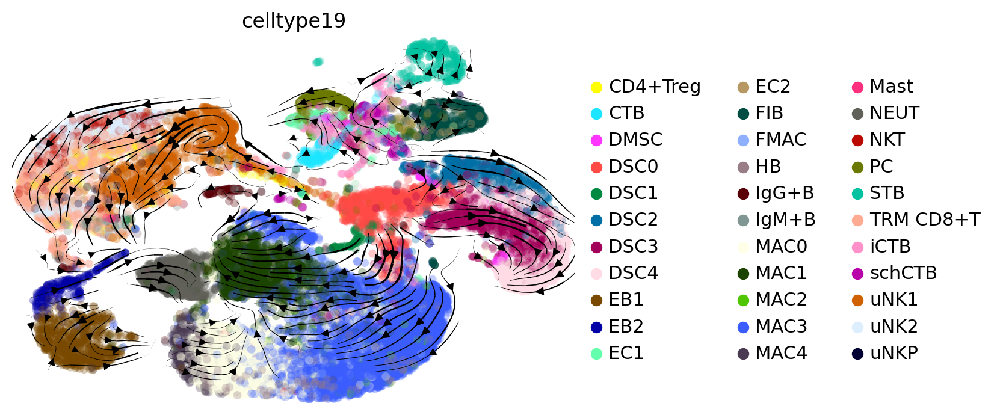

In [20]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color= "celltype19", legend_loc = "right margin", save = "clusters.svg")

In [21]:
scv.tl.differential_kinetic_test(adata, groupby='celltype19')

recovering dynamics (using 1/40 cores)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=54098) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:21:54) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
testing for differential kinetics
    finished (0:19:06) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


In [ ]:
scv.tl.recover_dynamics(adata)

#adata.write('/gscratch/kawaldorflab/jcorn427/placenta/scVelo_work/data/placenta.h5ad', compression='gzip')
#adata = sc.read('/gscratch/kawaldorflab/jcorn427/placenta/scVelo_work/data/placenta.h5ad')

In [23]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='celltype19')

testing for differential kinetics
    finished (0:02:08) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_diff_kin_top_15.svg


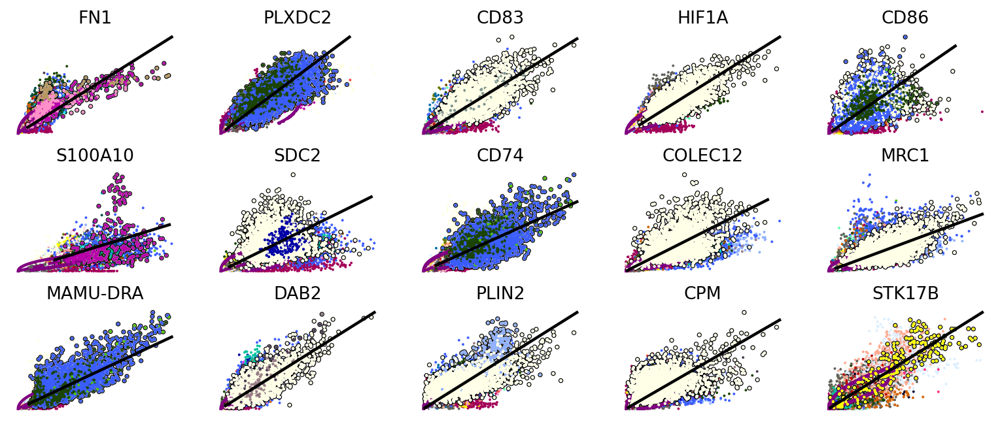

In [24]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', **kwargs, save="diff_kin_top_15.svg")

/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_diff_kin_top_15_30.svg


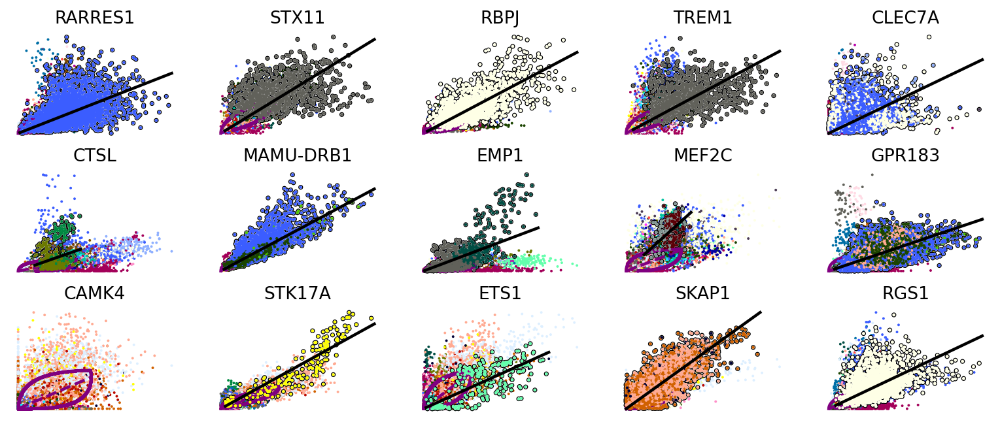

In [25]:
scv.pl.scatter(adata, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', **kwargs, save="diff_kin_top_15_30.svg")

In [4]:
scv.tl.velocity(adata, diff_kinetics=True)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:13) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:02:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


saving figure to file ./figures/scvelo_dif_kin.pdf


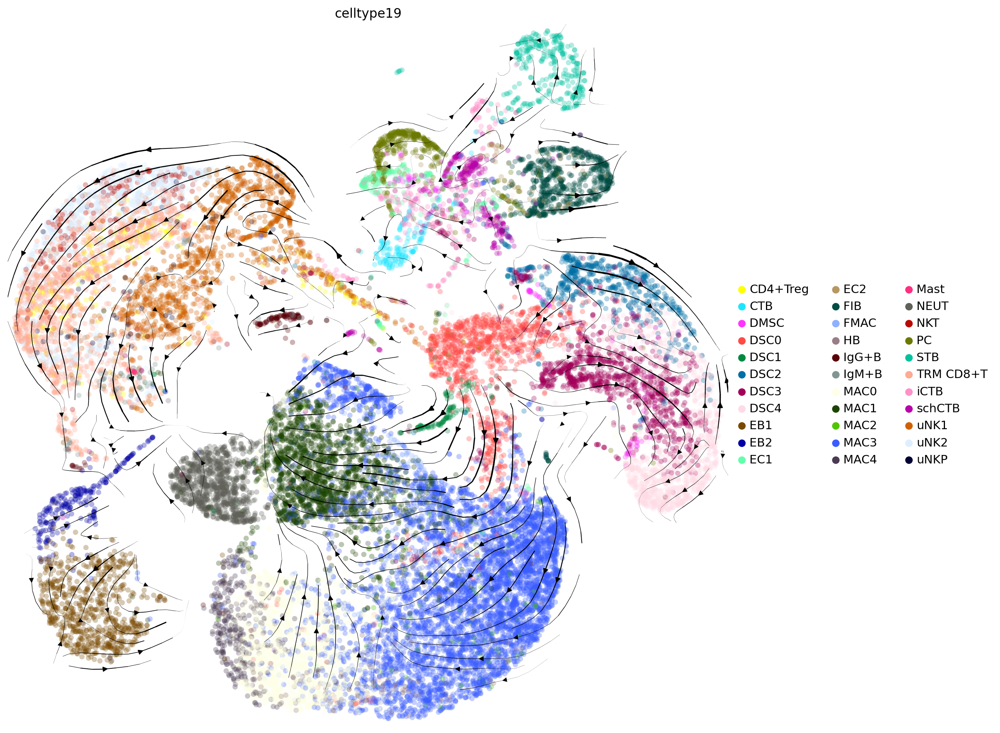

In [8]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color= "celltype19", legend_loc = "right margin", save = "dif_kin.pdf", figsize=(10,10))

/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_cell_direction_dif_kin.svg


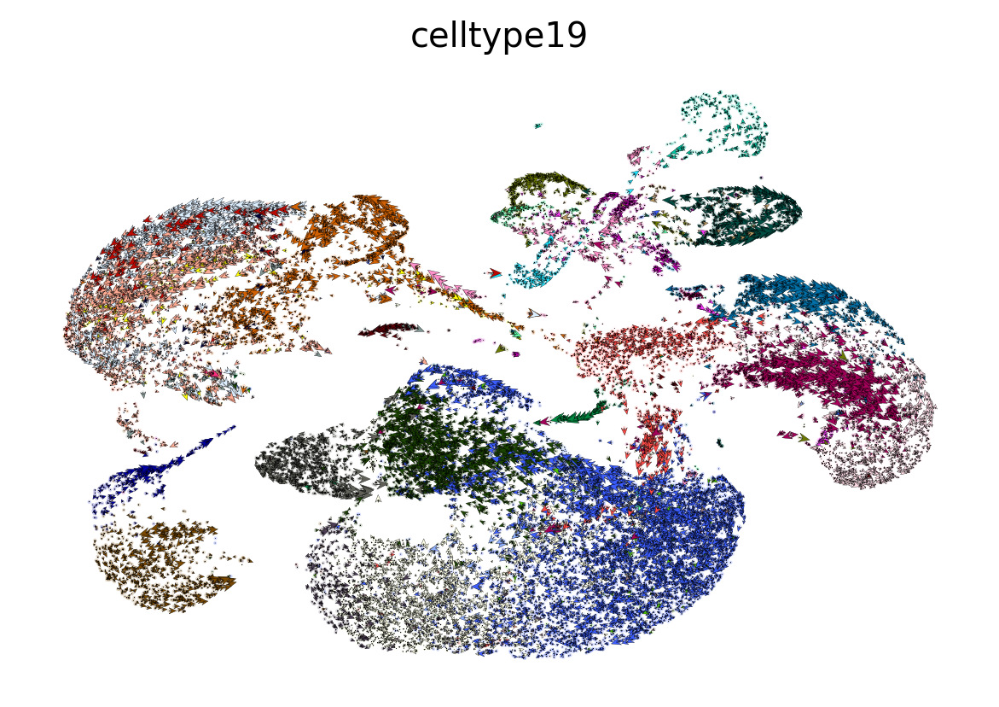

In [28]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120, color= "celltype19", save= "cell_direction_dif_kin.svg")

In [29]:
scv.tl.rank_velocity_genes(adata, groupby='celltype19', min_corr=.3)

ranking velocity genes


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:10) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [30]:
df = pandas.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

,CD4+Treg,CTB,DMSC,DSC0,DSC1,DSC2,DSC3,DSC4,EB1,EB2,...,NEUT,NKT,PC,STB,TRM CD8+T,iCTB,schCTB,uNK1,uNK2,uNKP
0,BICDL1,CD86,RERG,CD86,CD86,IL1R2,COL5A1,CDH11,PLXDC2,PLXDC2,...,SORL1,TNIK,FERMT2,CD86,TNIK,FERMT2,FERMT2,TEC,SKAP1,STK39
1,SKAP1,RARRES1,LAMA4,PLXDC2,NR4A3,DLG5,APBB2,ALPK2,CD86,RBPJ,...,NDRG1,SKAP1,PXDN,PLXDC2,SYTL2,VCL,CD86,STK39,TEC,THEMIS
2,RIPOR2,PELI1,ERRFI1,IL1A,STK17A,RCAN1,LAMA4,LTBP1,RBPJ,CD86,...,ALPL,RIPOR2,ADAMTS9,RBPJ,BCL2,APBB2,ALPK2,CAMK2B,BCL2,RIPOR2
3,TNIK,PLXDC2,IGF1R,HSPH1,PLXDC2,NID1,RORB,PXDN,IL1A,KCNK1,...,HIF1A,BICDL1,APBB2,IL1A,TOX,IGF1R,IL1A,THEMIS,PDGFD,TESC
4,PCED1B,IL1A,PRUNE2,RBPJ,CD38,FAP,MAOB,COL5A1,HIF1A,RARRES1,...,IGF1R,PTPN22,EDNRA,RABGEF1,RIPOR2,PDK4,EGFR,ITGAL,ITK,TEC


In [31]:
df.to_csv("dif_kin_dif_velo_genes.csv", index=False)

calculating cell cycle phase


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:241: DeprecationWarning: Bitwise inversion '~' on bool is deprecated. This returns the bitwise inversion of the underlying int object and is usually not what you expect from negating a bool. Use the 'not' operator for boolean negation or ~int(x) if you really want the bitwise inversion of the underlying int.
  r_genes: pd.Index[str] = obs_cut[(obs_cut == cut) & ~keep_ctrl_in_obs_cut].index
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:241: DeprecationWarning: Bitwise inversion '~' on bool is deprecated. This returns the bitwise inversion of the underlying int object and is usually not what you expect from negating a bool. Use the 'not' operator for boolean negation or ~int(x) if you really want the bitwise inversion of the underlying int.
  r_genes: pd.Index[str] = obs_cut[(obs_cut == cut) & ~keep_ctrl_in_obs_cut].index
/gscratch/ka

-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_dif_kin_cell_cycle.svg


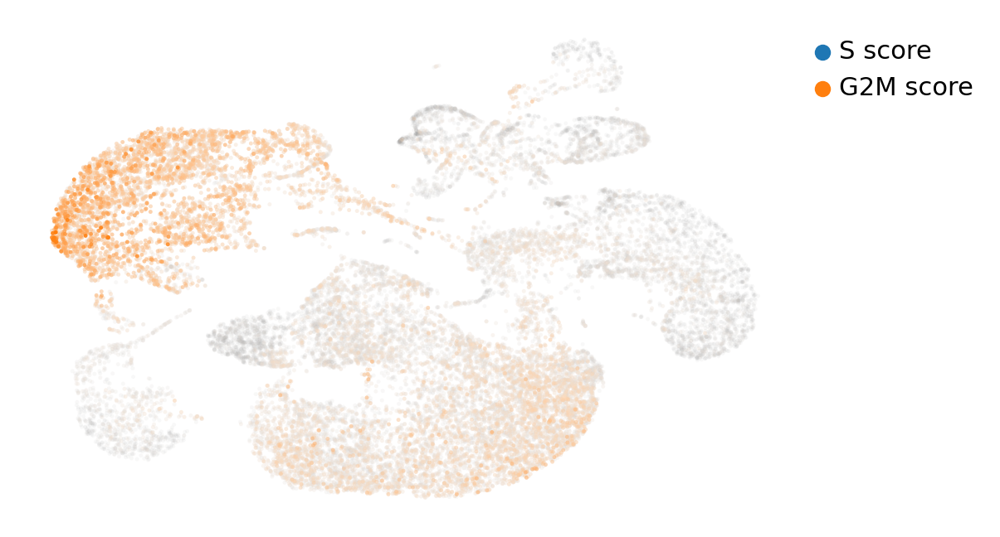

In [32]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], save="dif_kin_cell_cycle.svg")

/tmp/ipykernel_54098/4036529211.py:2: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  s_genes = scv.get_df(adata[:, s_genes], 'spearmans_score', sort_values=True).index
/tmp/ipykernel_54098/4036529211.py:3: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  g2m_genes = scv.get_df(adata[:, g2m_genes], 'spearmans_score', sort_values=True).index
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/minico

saving figure to file ./figures/scvelo_dif_kin_cell_cycle_genes.svg


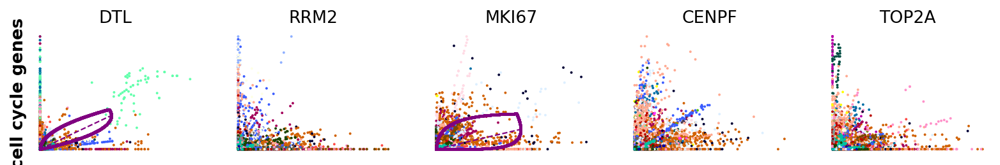

In [33]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adata)
s_genes = scv.get_df(adata[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adata[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adata, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs, color="celltype19", save="dif_kin_cell_cycle_genes.svg")

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_dif_kin_length_conf.svg


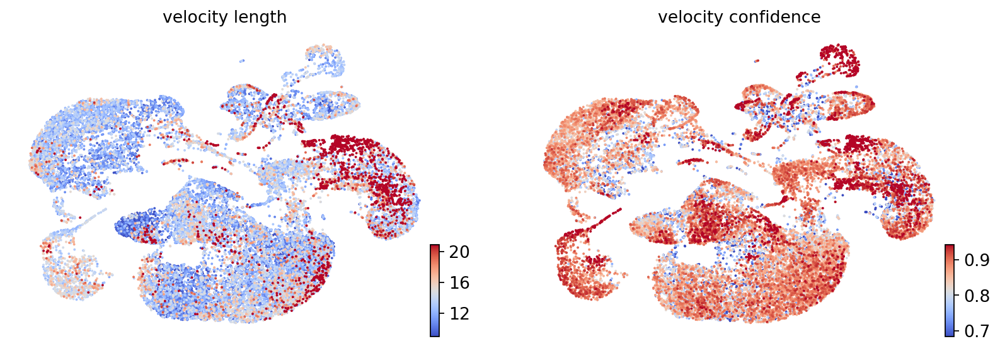

In [34]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], save= 'dif_kin_length_conf.svg')

In [35]:
keys= list(keys)
df = adata.obs.groupby('celltype19')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

celltype19,CD4+Treg,CTB,DMSC,DSC0,DSC1,DSC2,DSC3,DSC4,EB1,EB2,EC1,EC2,FIB,FMAC,HB,IgG+B,IgM+B,MAC0,MAC1,MAC2,MAC3,MAC4,Mast,NEUT,NKT,PC,STB,TRM CD8+T,iCTB,schCTB,uNK1,uNK2,uNKP
velocity_length,11.912534,14.389539,13.413565,13.407570,12.245689,49.561184,19.434265,14.196824,14.374229,14.312119,12.706790,11.646974,12.176641,13.562261,14.690833,15.286280,12.309863,10.745830,13.260072,14.928445,12.785728,14.219168,12.197499,10.467729,12.319664,12.000861,13.262185,12.727783,13.889200,17.856972,11.948359,11.927061,12.061428
velocity_confidence,0.782889,0.873741,0.842081,0.858542,0.889635,0.884741,0.886593,0.823430,0.888736,0.919465,0.864356,0.777490,0.853973,0.875965,0.820683,0.873695,0.840331,0.802683,0.844705,0.771001,0.831342,0.784991,0.716975,0.808879,0.821737,0.814969,0.926831,0.835179,0.783017,0.824286,0.830858,0.848537,0.680115


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_dif_kin_velo_graph.svg


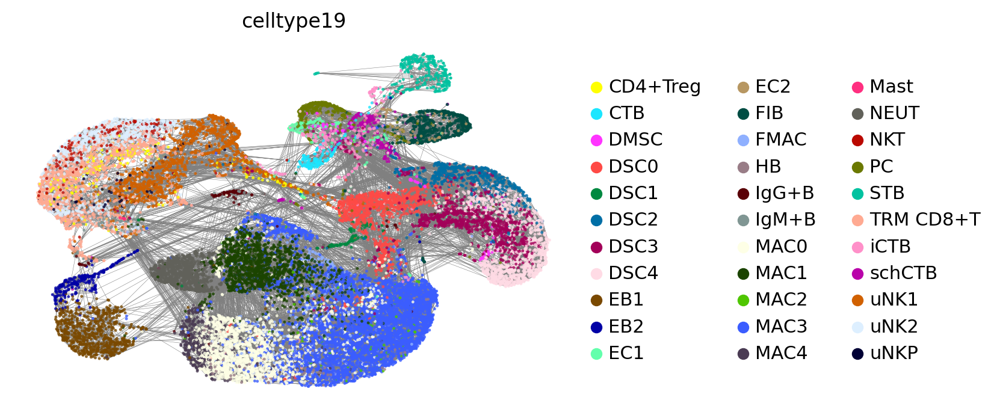

In [36]:
scv.pl.velocity_graph(adata, threshold=.1, color="celltype19", legend_loc="right margin", save="dif_kin_velo_graph.svg")

computing terminal states
    identified 7 regions of root cells and 2 regions of end points .
    finished (0:00:04) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_dif_kin_pseudo.svg


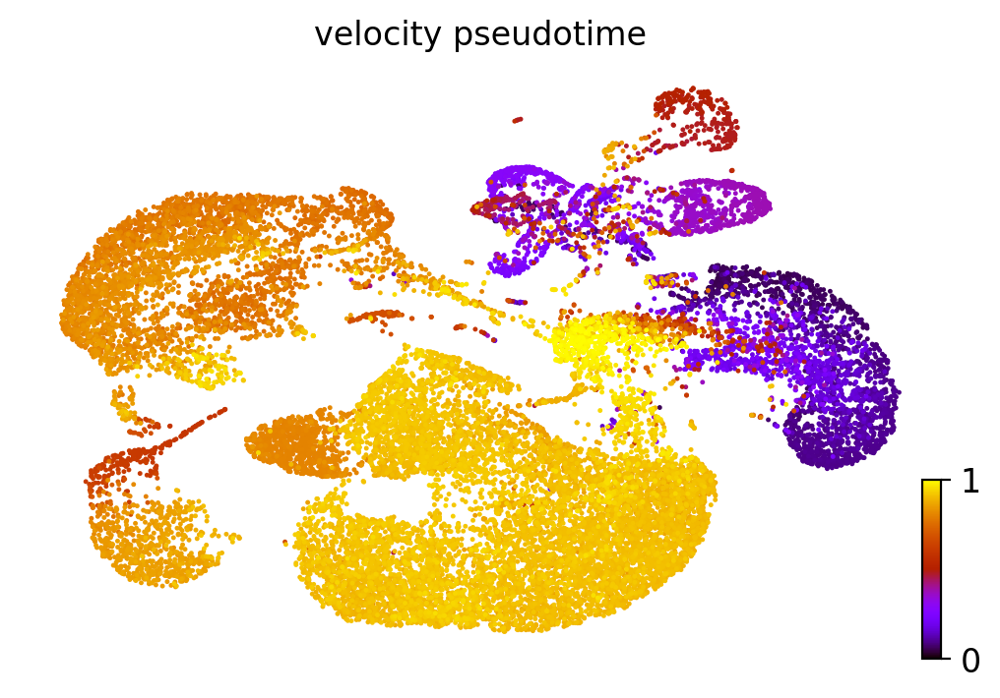

In [37]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot', save="dif_kin_pseudo.svg")

In [38]:
# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='celltype19')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:05) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/tmp/ipykernel_54098/81911873.py:6: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/core/_anndata.py:257: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0.039,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.038,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0.028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0.082,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0.21,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.056,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0.02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

saving figure to file ./figures/scvelo_dif_kin_paga.svg


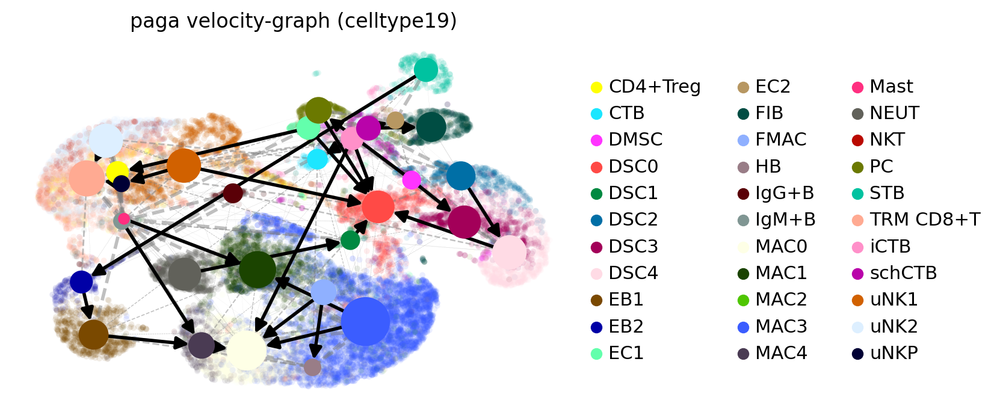

In [39]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save= "dif_kin_paga.svg")

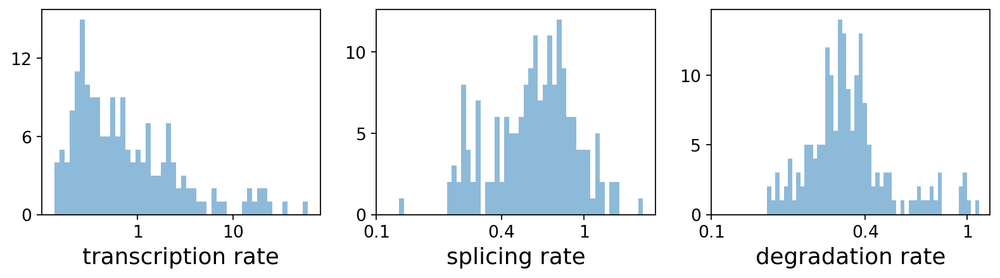

/tmp/ipykernel_54098/3438405563.py:10: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  scv.get_df(adata, 'fit*', dropna=True).head()


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_diff_kinetics,fit_pval_kinetics
Gene,,,,,,,,,,,,,,,,,
NLRP3,0.57,1.08,0.30,11.81,4.62e-01,0.18,0.44,1.06e-01,0.0,0.0,0.49,0.76,2.12,3.24,2.38,FMAC,2.63e-166
KIF26B,0.03,0.01,0.21,7.57,4.78e+01,0.61,0.02,7.07e-07,0.0,0.0,0.41,2.61,0.05,0.82,2.50,"DSC3,DSC4",8.99e-03
DTL,0.19,0.55,0.61,5.42,6.13e-01,0.07,0.06,2.84e-17,0.0,0.0,0.49,0.42,0.28,1.62,1.54,EC1,4.03e-08
GLUL,3.41,5.27,0.27,7.76,1.96e-01,0.19,1.49,6.16e-02,0.0,0.0,0.50,0.81,12.02,2.87,1.45,"MAC0,MAC3",2.40e-08
S100A8,70.71,112.82,1.49,8.57,6.40e-03,0.09,7.26,2.54e-02,0.0,0.0,0.50,0.62,33.83,1.34,0.67,NEUT,1.05e-14


In [40]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

computing latent time using root_cells as prior


    finished (0:00:07) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_dif_kin_latent_time.pdf


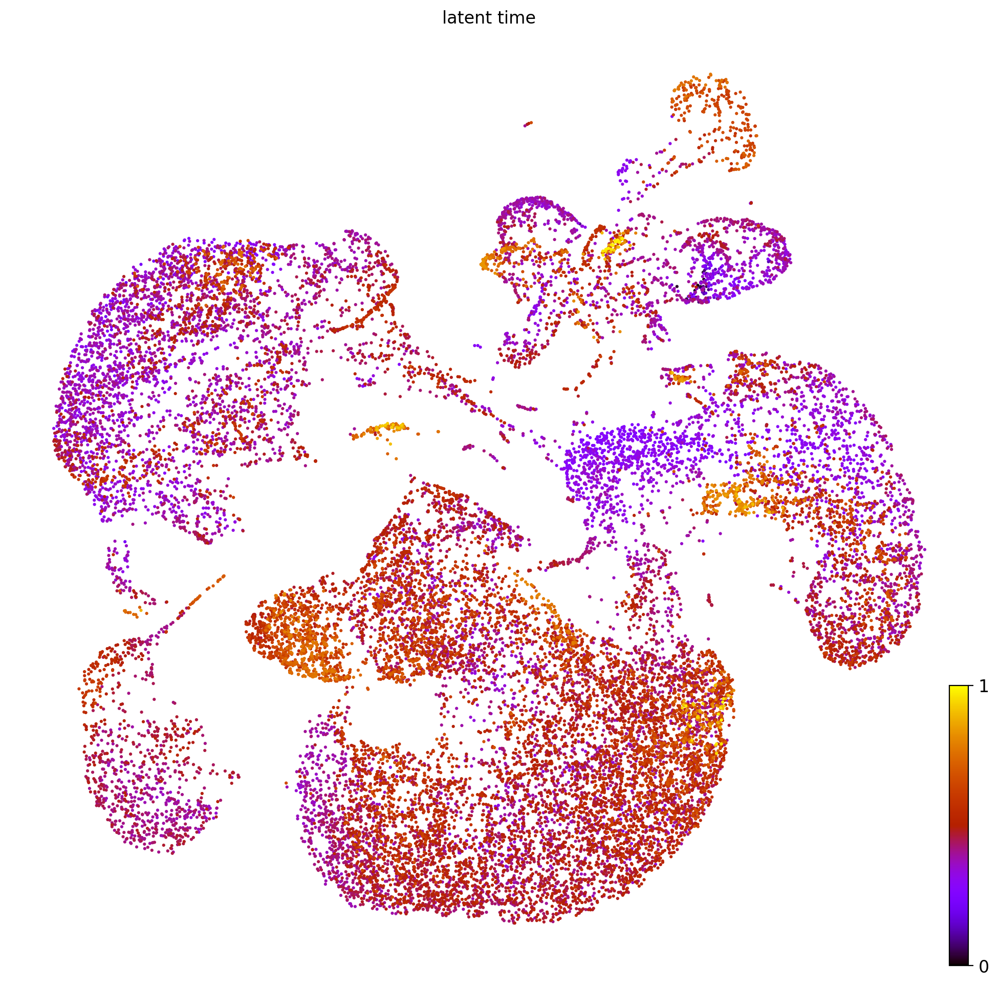

In [9]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=20, save="dif_kin_latent_time.pdf", figsize=(10, 10))

/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_heatmap_dif_kin_latent_hmap.svg


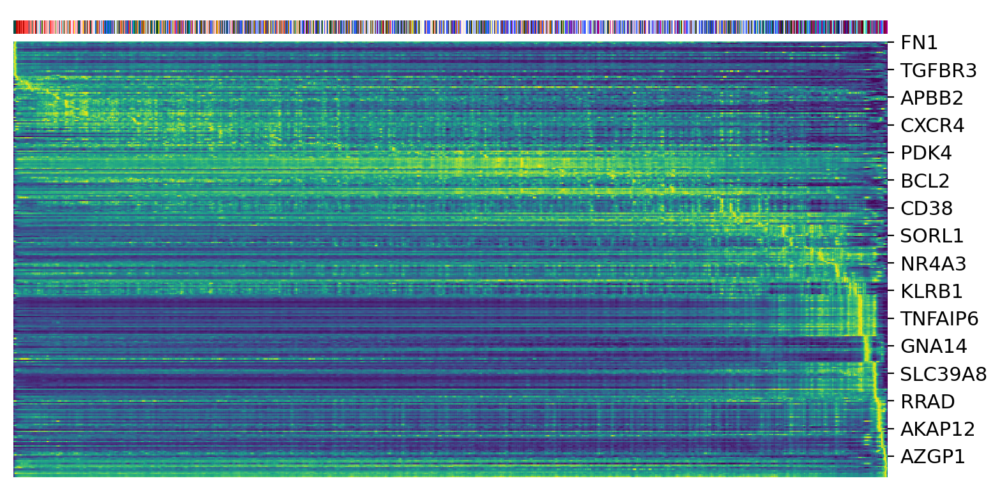

In [42]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='celltype19', n_convolve=100, save="dif_kin_latent_hmap.svg")

computing terminal states
    identified 7 regions of root cells and 2 regions of end points .
    finished (0:00:04) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/miniconda3/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/gscratch/kawaldorflab/jcorn427/mi

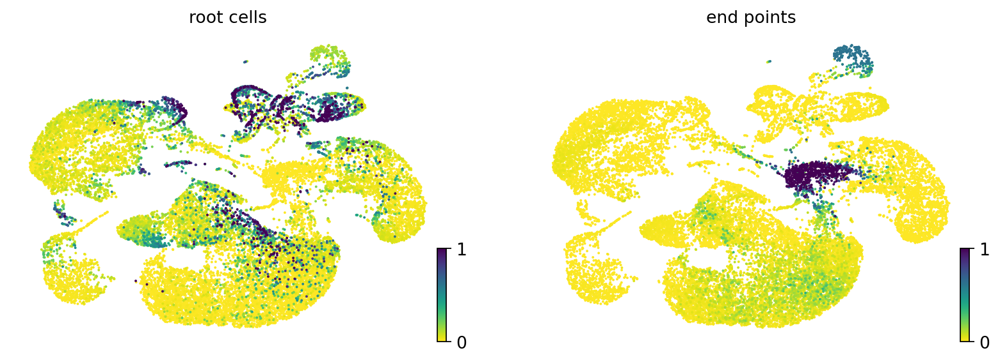

In [43]:
scv.tl.terminal_states(adata)
scv.pl.scatter(adata, color=["root_cells", "end_points"])

In [44]:
counts_s = scv.utils.sum_var(adata.layers['spliced'])
counts_u = scv.utils.sum_var(adata.layers['unspliced'])
fractions_u = counts_u / (counts_s + counts_u)
scv.pl.scatter(adata, color=fractions_u, smooth=True)

AttributeError: module 'scvelo.utils' has no attribute 'sum_var'

In [3]:
#adata.write('/gscratch/kawaldorflab/jcorn427/placenta/scVelo_work/data/placenta.h5ad', compression='gzip')
adata = sc.read('/gscratch/kawaldorflab/jcorn427/placenta/scVelo_work/data/placenta.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 25133 × 19634
    obs: 'Barcode', 'SCT_snn_res.0.5', 'SingleR.cluster.labels', 'Subgroup', 'celltype10', 'celltype11', 'celltype12', 'celltype13', 'celltype14', 'celltype15', 'celltype16', 'celltype17', 'celltype18', 'celltype19', 'celltype4', 'celltype6', 'celltype7', 'celltype8', 'celltype9', 'classification', 'fet_sex', 'main_labels', 'nCount_RNA', 'nCount_SCT', 'nFeature_RNA', 'nFeature_SCT', 'orig.ident', 'percent.mt', 'sample_id', 'seurat_clusters', 'sub_labels', 'tissue_type', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [4]:
# Perform Leiden clustering
scv.pp.neighbors(adata)
average_latent_time_per_cluster = adata.obs.groupby('celltype19')['latent_time'].mean()
print(average_latent_time_per_cluster)

computing neighbors
    finished (0:00:41) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
celltype19
CD4+Treg     0.426445
CTB          0.407476
DMSC         0.469595
DSC0         0.334495
DSC1         0.408268
DSC2         0.404713
DSC3         0.598909
DSC4         0.406300
EB1          0.429773
EB2          0.520516
EC1          0.660250
EC2          0.413025
FIB          0.339796
FMAC         0.595813
HB           0.520254
IgG+B        0.725093
IgM+B        0.445567
MAC0         0.492082
MAC1         0.498561
MAC2         0.470229
MAC3         0.490489
MAC4         0.410028
Mast         0.426042
NEUT         0.618432
NKT          0.294006
PC           0.380861
STB          0.627453
TRM CD8+T    0.374700
iCTB         0.426862
schCTB       0.546883
uNK1         0.444780
uNK2         0.448936
uNKP         0.413368
Name: latent_time, dtype: float64


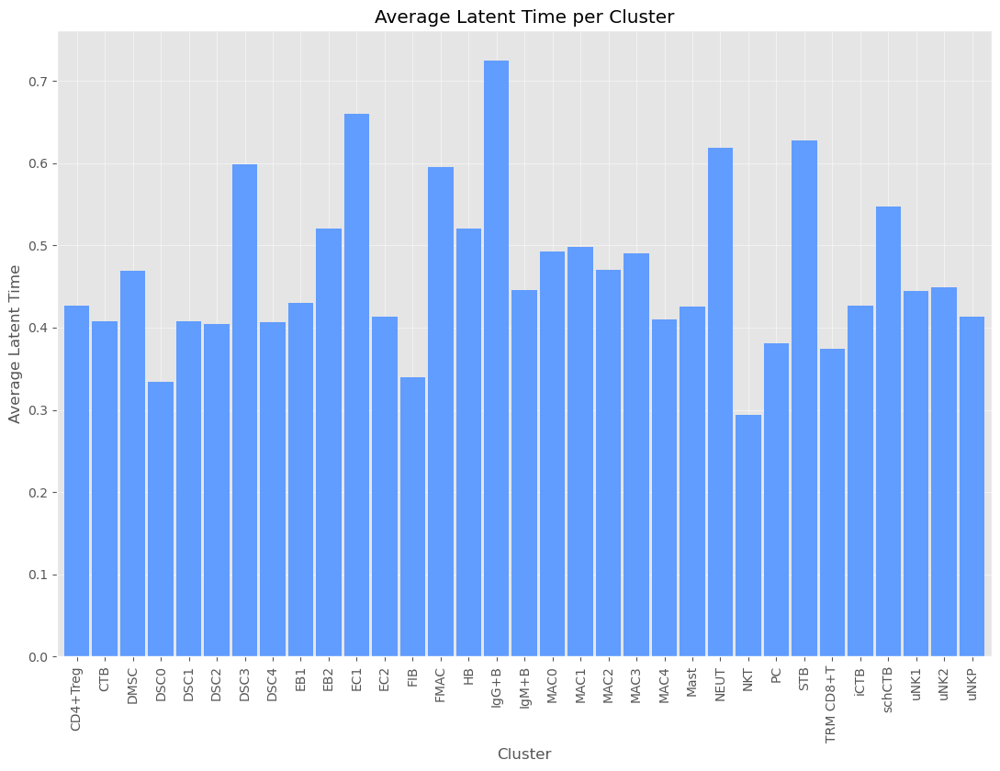

In [6]:
import matplotlib
import matplotlib.pyplot as plt # Import matplotlib for plot customization
import numpy as np
# ... (Previous code to calculate average_latent_time_per_cluster) ...

# Activate the 'ggplot' style
plt.style.use('ggplot')

# Create the figure with the desired size (in inches)
# 8.5 inches wide, 5.5 inches tall for a half-page
fig, ax = plt.subplots(figsize=(11, 8.5))  # Use object-oriented approach

# Plotting the bar chart with no gaps and default ggplot2 blue color
average_latent_time_per_cluster.plot.bar(ax=ax, width=0.9, edgecolor='none', color='#619CFF', zorder=2)

# Set the axis elements to be drawn below everything else
ax.set_axisbelow(True)

# Ensure grid lines are present and customize their appearance if needed
# Explicitly enable grid lines with a thicker linewidth
ax.grid(True, which='major', axis='both', linestyle='-', alpha=0.7, zorder=1, linewidth=0.5, rasterized=True) # Increased linewidth

# Customize the plot
ax.set_title('Average Latent Time per Cluster')
ax.set_xlabel('Cluster')
ax.set_ylabel('Average Latent Time')

# Set x-axis tick label rotation to 90 degrees (vertical)
plt.xticks(rotation=90, ha='center') # Changed rotation to 90 and alignment to center

plt.tight_layout()

# Save the figure as a PDF file BEFORE plt.show()
plt.savefig('average_latent_time_plot.pdf', bbox_inches='tight', dpi=300)

# Saving as an svg since PDF sucks.
# plt.savefig('average_latent_time_plot.svg', bbox_inches='tight', dpi=300)


# Save as png for debugging
# plt.savefig('average_latent_time_plot.png', bbox_inches='tight', dpi=300)

plt.show() # Now you can show the plot after it's saved